<div style="background:#ddffff;border-left: 6px solid #2196f3;">
<h1 style="text-align:center;">Animating data</h1>
<hr style="width:65%;height:2px;border-width:1;color:gray;background-color:gray;">
<p style="padding-left:20px;padding-right:20px;"></p>
</div>

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from matplotlib import rc
rc('animation', html='jshtml')

In [3]:
def wavelet(x, f, w, phi=0):
    return np.exp(1j * (2*np.pi*f*x + phi)) * np.exp((-4*np.log(2)*x**2) / w**2)

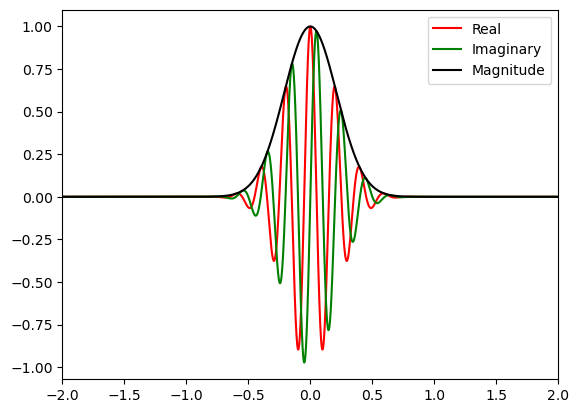

In [4]:
f = 5
w = .5
phi = 0
samplingRate = 500 # Hz
x = np.arange(-2*samplingRate, 2*samplingRate+1/samplingRate) / samplingRate
y = wavelet(x, f, w, phi)

plt.plot(x, np.real(y), 'r', label='Real')
plt.plot(x, np.imag(y), 'g', label='Imaginary')
plt.plot(x, np.abs(y), 'k', label='Magnitude')
plt.xlim((x[0], x[-1]))
plt.legend()

plt.show()

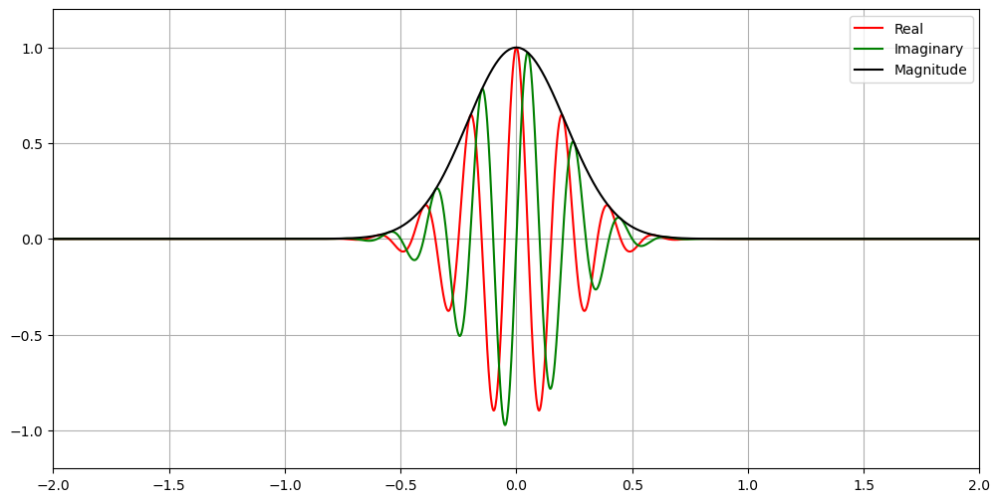

In [5]:
# Animate the change of the graph when we change params
fig,ax = plt.subplots(1, figsize=(12, 6))

plot1, = ax.plot(x, np.zeros(len(x)), 'r', label='Real')
plot2, = ax.plot(x, np.zeros(len(x)), 'g', label='Imaginary')
plot3, = ax.plot(x, np.zeros(len(x)), 'k', label='Magnitude')
ax.set_xlim((x[0], x[-1]))
ax.set_ylim((-1.2, 1.2))
ax.grid()

ax.legend()

phases = np.linspace(0, 2*np.pi, 200)

def aframe(phase):
    y_ = wavelet(x, f, w, phase)
    plot1.set_ydata(np.real(y_))
    plot2.set_ydata(np.imag(y_))
    plot3.set_ydata(np.abs(y_))
    return (plot1, plot2, plot3)

ani = animation.FuncAnimation(fig, aframe, phases, interval=50, repeat=True);

In [6]:
ani

In [7]:
# Möbius transform

def mobius(t, z):
    return ((t - 1) + (1 + t) * z) / ((t + 1) + (1 - t) * z)

In [8]:

a = np.linspace(-40, 40, 80)
b = np.linspace(-40, 40, 70)
mobtrans = np.zeros((len(a), len(b)), dtype=complex)
t = np.linspace(.2, 2, 99)

# function that draws a frame
def aframe(t):
    for i,aa in enumerate(a):
        for j,bb in enumerate(b):
            z = complex(aa, bb)
            mobtrans[i, j] = mobius(t, z)
    imh[0].set_data(np.real(mobtrans))
    imh[1].set_data(np.imag(mobtrans))
    imh[2].set_data(np.abs(mobtrans))
    return imh
    

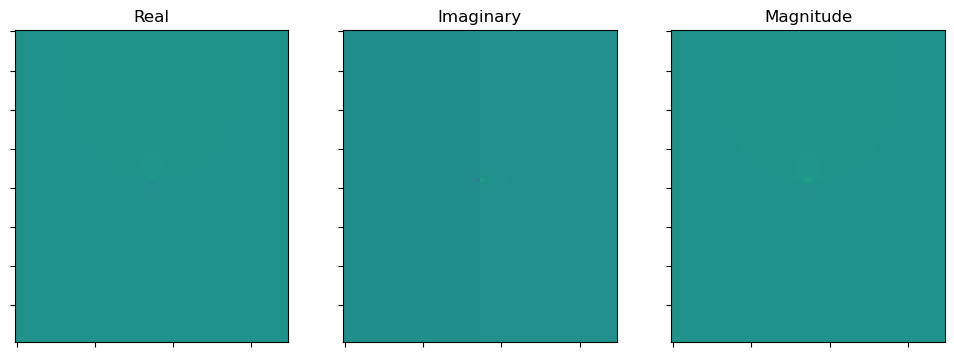

In [9]:
fig,ax = plt.subplots(1, 3, figsize=(12, 8))
imh = [None]*3
imh[0] = ax[0].imshow(np.zeros((len(a), len(b))), vmin=-50, vmax=50)
imh[1] = ax[1].imshow(np.zeros((len(a), len(b))), vmin=-50, vmax=50)
imh[2] = ax[2].imshow(np.zeros((len(a), len(b))), vmin=-50, vmax=50)

for ax_ in ax:
    ax_.tick_params(labelbottom=False, labelleft=False)
    
ax[0].set_title('Real')
ax[1].set_title('Imaginary')
ax[2].set_title('Magnitude')

    
ani = animation.FuncAnimation(fig, aframe, t, interval=50, repeat=True)

In [10]:
ani